<a href="https://colab.research.google.com/github/sudha-vijayakumar/257_safeML_IntrusionDetectionSystem/blob/main/Auto_Insurance_Prediction_Master.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Step-0: Import libraries

In [1]:
import numpy as np 
import pandas as pd 
import time
import math

pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) #Limiting floats output to 3 decimal points

#Installing via pip
!pip install -U pandas-profiling
from pandas_profiling import ProfileReport

#ignore warnings.
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn 

     |████████████████████████████████| 266kB 5.3MB/s 
     |████████████████████████████████| 71kB 5.2MB/s 
     |████████████████████████████████| 3.1MB 5.4MB/s 
     |████████████████████████████████| 71kB 7.0MB/s 
     |████████████████████████████████| 604kB 27.2MB/s 
     |████████████████████████████████| 296kB 37.4MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=e4c41d5c764cbf915417de7325d01e0f4ae3af97594e33d75cd5cbd2d1bfd718
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
Successfully built htmlmin
  Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1
  Found existing installation: pandas-profiling 1.4.1
    Uninstalling pandas-profiling-1.4.1:
      Successfully uninstalled pandas-profiling-1.4.1


### Step-1: Load training and test datasets

In [2]:
from google.colab import files
files.upload()

Saving AutoInsurance3.csv to AutoInsurance3.csv


{'AutoInsurance3.csv': b"\tfirst_name\tlast_name\temail\tvehicle_no\tcountry\tstate_code\tstate\ttotal_claim_amount\tresponse\tcoverage\teducation\tjoin_date\temployment_status\tgender\tincome\tlocation_code\tmarital_status\tmonthly_premium\tmonths_since_last_claim\tmonths_since_policy_inception\topen_complaints\tno_of_policies\tpolicy_type\tpolicy_level\tclaim_reason\tsales_channel\tvehicle_class\tvehicle_size\tcustomer_id\tpolicy_id\tclaim_id\n0\tAbby\tHambers\tahambers0@sbwire.com\tBU79786\tUS\tKS\tKansas\t276.3519279\tNo\tBasic\tBachelor\t2/24/11\tEmployed\tF\t56274\tSuburban\tMarried\t69\t32\t5\t0\t1\tCorporate Auto\tCorporate L3\tCollision\tAgent\tTwo-Door Car\tMedsize\t1\t1\t1\n1\tPalmer\tKarlmann\tpkarlmann1@youtube.com\tQZ44356\tUS\tNE\tNebraska\t697.9535903\tNo\tExtended\tBachelor\t1/31/11\tUnemployed\tF\t0\tSuburban\tSingle\t94\t13\t42\t0\t8\tPersonal Auto\tPersonal L3\tScratch/Dent\tAgent\tFour-Door Car\tMedsize\t2\t2\t2\n2\tCarolin\tYurygyn\tcyurygyn2@yahoo.com\tAI49188\tU

**1.1 Read datasets**

In [3]:
#read in data training and testing data.
train = pd.read_csv("AutoInsurance3.csv",sep='\t') 

**1.2 View datasets**

In [4]:
train.head(5)

,Unnamed: 0,first_name,last_name,email,vehicle_no,country,state_code,state,total_claim_amount,response,coverage,education,join_date,employment_status,gender,income,location_code,marital_status,monthly_premium,months_since_last_claim,months_since_policy_inception,open_complaints,no_of_policies,policy_type,policy_level,claim_reason,sales_channel,vehicle_class,vehicle_size,customer_id,policy_id,claim_id
0,0,Abby,Hambers,ahambers0@sbwire.com,BU79786,US,KS,Kansas,276.352,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Collision,Agent,Two-Door Car,Medsize,1,1,1
1,1,Palmer,Karlmann,pkarlmann1@youtube.com,QZ44356,US,NE,Nebraska,697.954,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Scratch/Dent,Agent,Four-Door Car,Medsize,2,2,2
2,2,Carolin,Yurygyn,cyurygyn2@yahoo.com,AI49188,US,OK,Oklahoma,1288.743,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Collision,Agent,Two-Door Car,Medsize,3,3,3
3,3,Noami,Sebert,nsebert3@google.com.hk,WW63253,US,MO,Missouri,764.586,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Collision,Call Center,SUV,Medsize,4,4,4
4,4,Norton,Chicken,nchicken4@usatoday.com,HB64268,US,KS,Kansas,281.369,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Collision,Agent,Four-Door Car,Medsize,5,5,5


**1.3 Data size & Priliminary data processing**

In [5]:
print("size of train data: {} ".format(train.shape))


#Dropping Id column as not required for 'prediction'
train.drop("Unnamed: 0", axis = 1, inplace = True)

print("\nsize of train data after dropping 'ID' : {} ".format(train.shape)) 


size of train data: (9000, 32) 

size of train data after dropping 'ID' : (9000, 31) 


### Step-2: EDA

##### **2.1 Data profiling with Pandas**

In [6]:
profile = ProfileReport(train, title='Auto Insurance - Profiling Report', explorative = True)
profile

##### **2.2 Understanding Features**

***2.2.1 Numerical features***

In [7]:
numerical_feats = train.dtypes[train.dtypes != "object"].index
print("Total continuous/numerical features: ", len(numerical_feats))
print("*"*70)
print(train[numerical_feats].columns)
print("*"*70)
train[numerical_feats].head()

Total continuous/numerical features:  10
**********************************************************************
Index(['total_claim_amount', 'income', 'monthly_premium',
       'months_since_last_claim', 'months_since_policy_inception',
       'open_complaints', 'no_of_policies', 'customer_id', 'policy_id',
       'claim_id'],
      dtype='object')
**********************************************************************


,total_claim_amount,income,monthly_premium,months_since_last_claim,months_since_policy_inception,open_complaints,no_of_policies,customer_id,policy_id,claim_id
0,276.352,56274,69,32,5,0,1,1,1,1
1,697.954,0,94,13,42,0,8,2,2,2
2,1288.743,48767,108,18,38,0,2,3,3,3
3,764.586,0,106,18,65,0,7,4,4,4
4,281.369,43836,73,12,44,0,1,5,5,5


***2.2.2 Categorical features***

In [8]:
categorical_feats = train.dtypes[train.dtypes == "object"].index
print("Total categorical features: ", len(categorical_feats))
print("*"*70)
print(train[categorical_feats].columns)
print("*"*70)
train[categorical_feats].head()

Total categorical features:  21
**********************************************************************
Index(['first_name', 'last_name', 'email', 'vehicle_no', 'country',
       'state_code', 'state', 'response', 'coverage', 'education', 'join_date',
       'employment_status', 'gender', 'location_code', 'marital_status',
       'policy_type', 'policy_level', 'claim_reason', 'sales_channel',
       'vehicle_class', 'vehicle_size'],
      dtype='object')
**********************************************************************


,first_name,last_name,email,vehicle_no,country,state_code,state,response,coverage,education,join_date,employment_status,gender,location_code,marital_status,policy_type,policy_level,claim_reason,sales_channel,vehicle_class,vehicle_size
0,Abby,Hambers,ahambers0@sbwire.com,BU79786,US,KS,Kansas,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Collision,Agent,Two-Door Car,Medsize
1,Palmer,Karlmann,pkarlmann1@youtube.com,QZ44356,US,NE,Nebraska,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Scratch/Dent,Agent,Four-Door Car,Medsize
2,Carolin,Yurygyn,cyurygyn2@yahoo.com,AI49188,US,OK,Oklahoma,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Collision,Agent,Two-Door Car,Medsize
3,Noami,Sebert,nsebert3@google.com.hk,WW63253,US,MO,Missouri,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Collision,Call Center,SUV,Medsize
4,Norton,Chicken,nchicken4@usatoday.com,HB64268,US,KS,Kansas,No,Basic,Bachelor,2/3/11,Employed,M,Rural,Single,Personal Auto,Personal L1,Collision,Agent,Four-Door Car,Medsize


***2.2.3 List of categorical features and their values***

In [9]:
for catg in list(categorical_feats) :
    print(train[catg].value_counts())
    print('#'*50)

Abby        7
Perry       6
Haslett     6
Brian       6
Paulie      6
           ..
Reena       1
Katuscha    1
Elianore    1
Rhodia      1
Kirstin     1
Name: first_name, Length: 5434, dtype: int64
##################################################
Gaunter      4
Eccott       4
Nock         4
O'Scanlan    4
De Vile      3
            ..
Sarjant      1
Hendrichs    1
Neilson      1
Akeherst     1
Bambrick     1
Name: last_name, Length: 8180, dtype: int64
##################################################
jtowerslc@yahoo.com               1
tmcguffie7d@craigslist.org        1
bmoattd0@indiegogo.com            1
liori5j@columbia.edu              1
scranham2x@jugem.jp               1
                                 ..
vamsbergeria@sina.com.cn          1
adye3b@unc.edu                    1
shillockcc@creativecommons.org    1
bcolefordj4@yellowpages.com       1
aarminc0@nhs.uk                   1
Name: email, Length: 9000, dtype: int64
##################################################
OB1

In [10]:
target = 'total_claim_amount'

### Step-3: Preprocessing

##### **3.2 Normalize target variables**

***3.2.1 Data distribution*** 

Skewness: 3.045192
Kurtosis: 13.986832


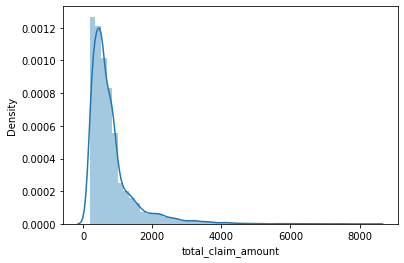

In [13]:
import seaborn as sns
sns.distplot(train[target]);
#skewness and kurtosis
print("Skewness: %f" % train[target].skew())
print("Kurtosis: %f" % train[target].kurt())

***3.2.1 Normalizing target*** 

Skewness: 0.572618
Kurtosis: 0.083455


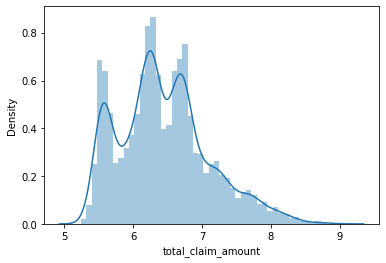

In [14]:
train[target] = np.log(train[target])
sns.distplot(train[target]);
# skewness and kurtosis
print("Skewness: %f" % train[target].skew())
print("Kurtosis: %f" % train[target].kurt())

#####***3.3 Handle Missing data***

***3.3.1 Identify missing data*** 

In [15]:
#training
train_na = (train.isnull().sum() / len(train)) * 100
train_na = train_na.drop(train_na[train_na == 0].index).sort_values(ascending=False)[:30]
missing_train = pd.DataFrame({'(%) Missing' :train_na})
missing_train.head()

,(%) Missing


No Missing data

##### **3.4 Remove weakly correlated features**






***3.4.1 View original training correlation***

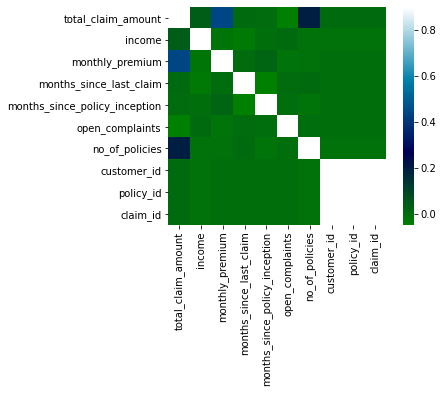

In [18]:
#Correlation map to see how training features are correlated with SalePrice

corrmat = train.corr()
sns.heatmap(corrmat, vmax=0.9, square=True, cmap='ocean')

***3.4.2 categorize features as strongly/ weakly correlated***

In [19]:
#(categories w/ strong and weak correlation determined based on E.D.A. tutorial in references)

catg_strong_corr = ['monthly_premium', 'no_of_policies']

catg_weak_corr = ['income', 
                  'months_since_last_claim', 'months_since_policy_inception',
                  'open_complaints', 'customer_id', 'policy_id',
                  'claim_id']

***3.4.3 Remove weeakly correlated features***

In [20]:
#remove all categories with weak correlation
for cat in catg_weak_corr:
    if cat in train:
        del train[cat]
    
print(train.head())

  first_name last_name  ...  vehicle_class vehicle_size
0       Abby   Hambers  ...   Two-Door Car      Medsize
1     Palmer  Karlmann  ...  Four-Door Car      Medsize
2    Carolin   Yurygyn  ...   Two-Door Car      Medsize
3      Noami    Sebert  ...            SUV      Medsize
4     Norton   Chicken  ...  Four-Door Car      Medsize

[5 rows x 24 columns]


***3.4.4 Group Correlation By Category***

In [21]:
#mean of SalePrice as a function of category, to intuit correlation
catg_list = catg_strong_corr.copy()
for catg in catg_list :
    g = train.groupby(catg)[target].mean()
    print(g)

monthly_premium
61    6.047
62    6.076
63    6.083
64    6.143
65    6.077
       ... 
290   7.686
295   8.162
296   7.783
297   7.061
298   7.021
Name: total_claim_amount, Length: 202, dtype: float64
no_of_policies
1   5.830
2   7.222
3   6.503
4   6.502
5   6.508
6   6.495
7   6.521
8   6.522
9   6.513
Name: total_claim_amount, dtype: float64


***3.4.5 Correlations of features. to SalePrice***


In [22]:
corr_matrix = train.corr().abs()
print(corr_matrix[target].sort_values(ascending=False))

total_claim_amount   1.000
monthly_premium      0.443
no_of_policies       0.196
Name: total_claim_amount, dtype: float64


***3.4.6 Drop features w/ low corelation to target***

In [23]:
for x in corr_matrix[target].sort_values(ascending=False).iteritems():
    if x[1] < 0.2:
        del train[x[0]]

In [24]:
corr_matrix = train.corr().abs()
print(corr_matrix[target].sort_values(ascending=False))

total_claim_amount   1.000
monthly_premium      0.443
Name: total_claim_amount, dtype: float64


***3.4.7 Highly correlated features to target***

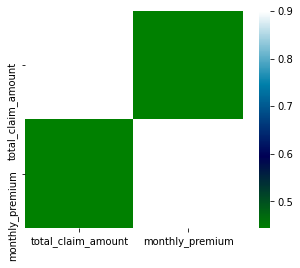

In [26]:
corr_matrix = train.corr().abs()
sns.heatmap(corr_matrix, vmax=0.9, cmap="ocean", square=True)

##### **3.5 Data Encoding**


In [27]:
from sklearn.preprocessing import LabelEncoder
cols = [i for i in train.columns if train.dtypes[i]=='object']

for c in cols:
    lbl = LabelEncoder() 
    lbl.fit(list(train[c].values)) 
    train[c] = lbl.transform(list(train[c].values))
    
print('Shape all_train: {}'.format(train.shape))

Shape all_train: (9000, 23)


In [28]:
print(train)

      first_name  last_name  email  ...  sales_channel  vehicle_class  vehicle_size
0             10       3407    296  ...              0              5             1
1           4136       4037   6939  ...              0              0             1
2            929       8139   2123  ...              0              5             1
3           3993       6689   6627  ...              2              3             1
4           4031       1395   6439  ...              0              0             1
...          ...        ...    ...  ...            ...            ...           ...
8995        3977       1774   6455  ...              0              3             1
8996        1720       2702   2823  ...              0              0             2
8997        1083       2052   1616  ...              3              0             1
8998        5213        708   8549  ...              0              0             1
8999         842       1821    933  ...              0              3       

In [29]:
#move "claim amount" target column to last column again

target_train = train.pop(target)

train.insert(20, target, target_train)

print(train.iloc[:,20])
print(train.head)

0      5.622
1      6.548
2      7.161
3      6.639
4      5.640
        ... 
8995   5.821
8996   7.546
8997   5.587
8998   7.246
8999   6.723
Name: total_claim_amount, Length: 9000, dtype: float64
<bound method NDFrame.head of       first_name  last_name  ...  vehicle_class  vehicle_size
0             10       3407  ...              5             1
1           4136       4037  ...              0             1
2            929       8139  ...              5             1
3           3993       6689  ...              3             1
4           4031       1395  ...              0             1
...          ...        ...  ...            ...           ...
8995        3977       1774  ...              3             1
8996        1720       2702  ...              0             2
8997        1083       2052  ...              0             1
8998        5213        708  ...              0             1
8999         842       1821  ...              3             1

[9000 rows x 23 columns]>


##### ***3.7 Scaling/ Removing undesired skewed/ Kurtosis***

In [30]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(train,test_size=0.10)

train_head = np.asarray(train['total_claim_amount'])
test_head = np.asarray(test['total_claim_amount'])

train = train.drop(['total_claim_amount'], 1)
test = test.drop(['total_claim_amount'], 1)

***3.7.0 Using MaxAbsScaler Scaler***

In [31]:
from sklearn.preprocessing import MaxAbsScaler
scaler = MaxAbsScaler()

X_train = train.iloc[:,:21].copy()
scaled_feat = scaler.fit_transform(X_train.values)
X_train = pd.DataFrame(scaled_feat, index=X_train.index, columns = X_train.columns)
train = X_train.copy()

scaled_test = scaler.fit_transform(test)
test = pd.DataFrame(scaled_test, index=test.index, columns = test.columns)


***3.7.1 View skew/ kurtosis*** 

### Step-4: Data Preparation for Modeling

***4.1 Save preprocessed data***

In [32]:
train.to_csv('train_pp.csv')
test.to_csv('test_pp.csv')

print('Preprocessed data saved successfully!')

Preprocessed data saved successfully!


### Step-5: Model Analysis

#### ***5.1 Import model libraries***

In [33]:
from sklearn.model_selection import cross_val_score,RepeatedKFold,GridSearchCV, RandomizedSearchCV

from sklearn.metrics import mean_squared_error,mean_squared_log_error
from sklearn.metrics import make_scorer

from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
import xgboost as xgb
!pip install catboost
from catboost import CatBoostRegressor
import lightgbm as lgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn import svm
from sklearn.linear_model.stochastic_gradient import SGDRegressor
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans 
from scipy.spatial.distance import cdist 

from mlxtend.regressor import StackingCVRegressor
from sklearn.ensemble import VotingRegressor
import time


     |████████████████████████████████| 66.3MB 54kB/s 


#### ***5.2 Evaluation metric functions***

**Declare Model performance trackers**

In [34]:
r2Lst=[]
maeLst=[]
mseLst=[]
rmseLst = []
rmlseLst = []

models = []
train_time = []

In [35]:
from sklearn import metrics
def evalModel(y,y_pred,model):

  r2=metrics.r2_score(y,y_pred)
  mae=metrics.mean_absolute_error(y, y_pred)
  mse=metrics.mean_squared_error(y, y_pred)
  rmse=np.sqrt(metrics.mean_squared_error(y, y_pred))
  rmlse=np.sqrt(metrics.mean_squared_log_error(y, y_pred))

  models.append(model)  

  r2Lst.append(r2)
  maeLst.append(mae)
  mseLst.append(mse)
  rmseLst.append(rmse)
  rmlseLst.append(rmlse)

  print("R-Square Value",r2)
  print("\n")
  print ("mean_absolute_error :",mae)
  print("\n")
  print ("mean_squared_error : ",mse)
  print("\n")
  print ("root_mean_squared_error : ",rmse)
  print("\n")
  print ("root_mean_square_logarithmic_error : ",rmlse)

  #store prediction and target for generating accuracy reports.
  df = pd.DataFrame({'Actual':y,'Predicted':y_pred})
  df.to_csv(model+'.csv')


#### ***5.3 Machine Learning - Regression***

##### 5.3.0 **Cross validation settings**

In [36]:
n_folds = 5 

def rmsle_cv(model):
    # kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(train.values)
    kf = RepeatedKFold(n_splits=n_folds, n_repeats=3, random_state=1).get_n_splits(train.values)
    rmsle= np.sqrt(-cross_val_score(model, train.values, train_head, scoring="neg_mean_squared_error", cv = kf))
    return(rmsle)

def rmsle(y, y_pred):
    return np.sqrt(mean_squared_log_error(y, y_pred))

In [37]:
targetPrice = train_head #Requested claim price

##### 5.3.1 Technique: **Regularization**

###### 5.3.1.1 Model: **Ridge Regression**

In [38]:
start_time = time.time()

alpha_vals=[0.01, 0.2, 0.3, 0.4, 0.5]

model_ridge = RidgeCV(alphas=alpha_vals, normalize=True, cv=n_folds)

score = rmsle_cv(model_ridge)

print("(Ridge) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

model_ridge.fit(train, targetPrice)
ridge_train_pred = model_ridge.predict(train)

#metrics
evalModel(targetPrice, ridge_train_pred,'Ridge')

train_time.append(time.time()-start_time)

(Ridge) CV score: (Mean):0.5837, (Std):0.0130

R-Square Value 0.20898965286940852


mean_absolute_error : 0.45126544959387693


mean_squared_error :  0.3391633812298856


root_mean_squared_error :  0.5823773529507184


root_mean_square_logarithmic_error :  0.07673235991000878


###### 5.3.1.2 Model: **Lasso Regression**

In [39]:
start_time = time.time()

alpha_vals=[0.01, 0.2, 0.3, 0.4, 0.5]
model_lasso = LassoCV(alphas=alpha_vals, normalize=True, cv=n_folds)

score = rmsle_cv(model_lasso)

print("(Lasso) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

model_lasso.fit(train, targetPrice)
lasso_train_pred = model_lasso.predict(train)

evalModel(targetPrice, lasso_train_pred,'Lasso')

train_time.append(time.time()-start_time)

(Lasso) CV score: (Mean):0.6547, (Std):0.0138

R-Square Value 0.0


mean_absolute_error : 0.5223159532646786


mean_squared_error :  0.4287723699951697


root_mean_squared_error :  0.6548071242703226


root_mean_square_logarithmic_error :  0.08651324977727787


##### 5.3.2 Technique: **Boosting**

###### 5.3.2.1 Model: **XGBoost**

**Find best (hyper)parameter by tuning**

In [40]:

# model=xgb.XGBRegressor()

# booster=['gbtree','gblinear']
# learning_rate=[0.001,0.01,0.1,0.2,0.5]
# n_estimators=[50,100,150,200,250,300]
# max_depth=[2,4,6,8]
# param_grid=dict(booster=booster,max_depth=max_depth,n_estimators=n_estimators,learning_rate=learning_rate)

# random_search=RandomizedSearchCV(model,param_grid,scoring='neg_mean_squared_error',n_jobs=-1,cv=n_folds)
# result=random_search.fit(train,targetPrice)
# print(result.best_estimator_)

[08:51:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=4, min_child_weight=1, missing=None, n_estimators=200,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)


In [59]:
start_time = time.time()

model_xgb = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=4, min_child_weight=1, missing=None, n_estimators=200,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

score = rmsle_cv(model_xgb)

print("(XGBoost) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

model_xgb.fit(train, targetPrice)
xgb_train_pred = model_xgb.predict(train)

evalModel(targetPrice, xgb_train_pred,'XGB')

train_time.append(time.time()-start_time)

[09:13:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:13:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:13:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:13:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:13:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:13:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:13:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[09:13:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

###### 5.3.2.2 Model: **catBoost**

**Find best (hyper)parameter by tuning**

In [41]:
# param_grid = {'depth': [6,8,10],
#                   'learning_rate': [0.01, 0.05, 0.1],
#                   'iterations': [30, 50, 100,1000]
#                  }
# model_catb = CatBoostRegressor()
# grid=RandomizedSearchCV(model_catb,param_grid,scoring='neg_mean_squared_log_error',n_jobs=-1,cv=n_folds)
# result = grid.fit(train, targetPrice)
# print(result.best_params_)

0:	learn: 0.6535916	total: 50.8ms	remaining: 50.7s
1:	learn: 0.6522791	total: 54.9ms	remaining: 27.4s
2:	learn: 0.6509431	total: 58.2ms	remaining: 19.4s
3:	learn: 0.6496788	total: 61.8ms	remaining: 15.4s
4:	learn: 0.6484138	total: 65.4ms	remaining: 13s
5:	learn: 0.6471214	total: 68.9ms	remaining: 11.4s
6:	learn: 0.6459138	total: 72.4ms	remaining: 10.3s
7:	learn: 0.6447819	total: 75.9ms	remaining: 9.41s
8:	learn: 0.6436278	total: 79.5ms	remaining: 8.76s
9:	learn: 0.6425760	total: 83ms	remaining: 8.21s
10:	learn: 0.6415387	total: 86.3ms	remaining: 7.76s
11:	learn: 0.6404381	total: 89.8ms	remaining: 7.39s
12:	learn: 0.6393818	total: 93.2ms	remaining: 7.08s
13:	learn: 0.6383176	total: 96.7ms	remaining: 6.81s
14:	learn: 0.6372467	total: 100ms	remaining: 6.58s
15:	learn: 0.6362847	total: 104ms	remaining: 6.38s
16:	learn: 0.6352258	total: 107ms	remaining: 6.2s
17:	learn: 0.6342223	total: 111ms	remaining: 6.05s
18:	learn: 0.6332448	total: 115ms	remaining: 5.92s
19:	learn: 0.6322482	total: 118m

In [45]:
start_time = time.time()

model_catb = CatBoostRegressor(iterations=1000,
                          learning_rate=0.01,
                          depth=6)

score = rmsle_cv(model_catb)

print("(catBoost) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

model_catb.fit(train, targetPrice)
catb_train_pred = model_catb.predict(train)

evalModel(targetPrice, catb_train_pred,'CatBoost')

train_time.append(time.time()-start_time)

Streaming output truncated to the last 5000 lines.
15:	learn: 0.6361686	total: 63ms	remaining: 3.87s
16:	learn: 0.6352294	total: 67ms	remaining: 3.87s
17:	learn: 0.6343059	total: 71ms	remaining: 3.87s
18:	learn: 0.6333323	total: 74.8ms	remaining: 3.86s
19:	learn: 0.6324286	total: 78.2ms	remaining: 3.83s
20:	learn: 0.6315301	total: 81.6ms	remaining: 3.8s
21:	learn: 0.6305630	total: 85.3ms	remaining: 3.79s
22:	learn: 0.6295732	total: 89ms	remaining: 3.78s
23:	learn: 0.6286012	total: 92.8ms	remaining: 3.77s
24:	learn: 0.6276799	total: 96.5ms	remaining: 3.76s
25:	learn: 0.6267881	total: 101ms	remaining: 3.77s
26:	learn: 0.6259490	total: 104ms	remaining: 3.75s
27:	learn: 0.6250964	total: 108ms	remaining: 3.73s
28:	learn: 0.6242801	total: 111ms	remaining: 3.72s
29:	learn: 0.6235195	total: 115ms	remaining: 3.71s
30:	learn: 0.6226229	total: 118ms	remaining: 3.7s
31:	learn: 0.6218829	total: 122ms	remaining: 3.68s
32:	learn: 0.6210861	total: 125ms	remaining: 3.67s
33:	learn: 0.6203637	total: 129

##### 5.3.3 Technique: **Bagging Regressors**

###### 5.3.3.1 Model: **Random Forest Regressor**

**Find best (hyper)parameter by tuning**

In [42]:

# # Create the parameter grid based on the results of random search 
# param_grid = {
#     'bootstrap': [True],
#     'max_depth': [80, 90, 100, 110],
#     'max_features': [2, 3],
#     'min_samples_leaf': [3, 4, 5],
#     'min_samples_split': [8, 10, 12],
#     'n_estimators': [100, 200, 300, 1000]
# }
# # Create a based model
# model_rf = RandomForestRegressor()
# # Instantiate the grid search model
# grid_search = RandomizedSearchCV(model_rf,param_grid,scoring='neg_mean_squared_error',n_jobs=-1,cv=n_folds)
# # Fit the grid search to the data
# result = grid_search.fit(train, targetPrice)
# print(result.best_params_)

{'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 3, 'max_features': 3, 'max_depth': 100, 'bootstrap': True}


In [46]:
start_time = time.time()
model_rf = RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=100, max_features=3, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=3,
                      min_samples_split=10, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

score = rmsle_cv(model_rf)
print("(Random Forest) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

model_rf.fit(train, targetPrice)
rf_train_pred = model_rf.predict(train)

evalModel(targetPrice, rf_train_pred,'Random Forest')

train_time.append(time.time()-start_time)

(Random Forest) CV score: (Mean):0.5668, (Std):0.0111

R-Square Value 0.5955663865156329


mean_absolute_error : 0.3177967687644606


mean_squared_error :  0.1734099589594025


root_mean_squared_error :  0.4164252141254207


root_mean_square_logarithmic_error :  0.054583496993798504


##### 5.3.5 Technique: **SVM**

**Find best (hyper)parameter by tuning**

In [48]:
# # defining parameter range 
# model_svm = svm.SVR()
# param_grid = {'C': [0.1, 1, 10, 100, 1000],  
#               'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
#               'kernel': ['rbf']}  
  
# grid =RandomizedSearchCV(model_svm,param_grid,scoring='neg_mean_squared_error',n_jobs=-1,cv=n_folds)

  
# # fitting the model for grid search 
# result = grid.fit(train, targetPrice) 
# print(result.best_estimator_)

In [49]:
start_time = time.time()

folds = 5
seed = 7

model_label='svm-rbf'

# build model
model_svm = svm.SVR(C=0.1, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.1,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

score = rmsle_cv(model_svm)

print("(SVM) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

# fit model
model_svm.fit(train, targetPrice)
svm_train_pred = model_svm.predict(train)

evalModel(targetPrice, svm_train_pred,'SVM')

train_time.append(time.time()-start_time)

(SVM) CV score: (Mean):0.5880, (Std):0.0120

R-Square Value 0.20782393496784146


mean_absolute_error : 0.45122456869811506


mean_squared_error :  0.3396632088572863


root_mean_squared_error :  0.5828063219091625


root_mean_square_logarithmic_error :  0.07684981562350958


##### **5.3.6 Technique: SGD**

In [50]:
start_time = time.time()

sgd_reg=SGDRegressor(penalty='l1',max_iter=10000,eta0=0.0001,alpha=0.0008,shuffle=True)

score = rmsle_cv(sgd_reg)

sgd_reg.fit(train, targetPrice)

sgd_train_pred = sgd_reg.predict(train)

evalModel(targetPrice, sgd_train_pred,'SGD')

train_time.append(time.time()-start_time)

R-Square Value -1.5530237283554253


mean_absolute_error : 0.8345303177641185


mean_squared_error :  1.09466603466086


root_mean_squared_error :  1.0462628898421562


root_mean_square_logarithmic_error :  0.14311987338858892


##### 5.3.6 Technique: **Linear regression**

In [51]:
start_time = time.time()

model_linear = LinearRegression()
model_linear.fit(train, targetPrice)
linear_train_pred = model_linear.predict(train)

evalModel(targetPrice, linear_train_pred,'Linear')

train_time.append(time.time()-start_time)

R-Square Value 0.20911549184643974


mean_absolute_error : 0.4511328010741264


mean_squared_error :  0.33910942495346613


root_mean_squared_error :  0.5823310269541424


root_mean_square_logarithmic_error :  0.07671776465364354


##### 5.3.7 Technique: **KNN**

1 : 1.4322596965083711
2 : 1.3402041338190558
3 : 1.3067298893104564
4 : 1.2774592777594227
5 : 1.2515016029046628
6 : 1.2343460251533338
7 : 1.216482518648911
8 : 1.2037562430138768
9 : 1.1994432039911576


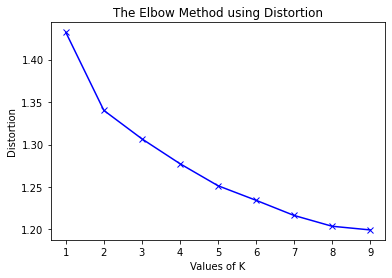

In [53]:
import matplotlib.pyplot as plt 

start_time = time.time()

X = train

distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(X) 
    kmeanModel.fit(X)     
      
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / X.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / X.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 

plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

**Choosing 2-Neighbours as inferred from the 'elbow' curve**

In [54]:
from sklearn.neighbors import KNeighborsRegressor
model_knn= KNeighborsRegressor(n_neighbors=2)
model_knn.fit(train, targetPrice)

score = rmsle_cv(model_knn)

print("(KNN) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

model_knn.fit(train, targetPrice)
knn_train_pred = model_knn.predict(train)

evalModel(targetPrice, knn_train_pred,'KNN')

train_time.append(time.time()-start_time)

(KNN) CV score: (Mean):0.7042, (Std):0.0181

R-Square Value 0.6181953082695967


mean_absolute_error : 0.2995180320414128


mean_squared_error :  0.1637073025485202


root_mean_squared_error :  0.4046075908192037


root_mean_square_logarithmic_error :  0.053348309423086195


##### 5.3.8 Technique: **Decision Tree**

**Find best (hyper)parameter by tuning**

In [55]:

# param_grid = {
#     'max_depth': [80, 90, 100, 110],
#     'max_features': [2, 3],
#     'min_samples_leaf': [3, 4, 5],
#     'min_samples_split': [8, 10, 12],
# }
# clf_tree=DecisionTreeRegressor()
# grid =RandomizedSearchCV(clf_tree,param_grid,scoring='neg_mean_squared_error',n_jobs=-1,cv=n_folds)
# # fitting the model for grid search 

# result = grid.fit(train, targetPrice) 
# print(result.best_params_)

In [56]:
#model_dt = DecisionTreeRegressor(max_depth=90,max_features=3,min_samples_leaf=4,min_samples_split=8)
start_time = time.time()
model_dt = DecisionTreeRegressor()
score = rmsle_cv(model_dt)

print("(DT) CV score: (Mean):{:.4f}, (Std):{:.4f}\n".format(score.mean(), score.std()))

model_dt.fit(train, targetPrice)
dt_train_pred = model_dt.predict(train)

evalModel(targetPrice, dt_train_pred,'DT')

train_time.append(time.time()-start_time)

(DT) CV score: (Mean):0.7920, (Std):0.0315

R-Square Value 0.9999999984702682


mean_absolute_error : 3.1091860498642264e-06


mean_squared_error :  6.559067341537591e-10


root_mean_squared_error :  2.5610676175254708e-05


root_mean_square_logarithmic_error :  3.5570122395495016e-06


##### 5.3.9 Technique: **Choose best regressor as meta-regressor for stacking**

In [60]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'rmlse':rmlseLst})
data  = go.Data([
            go.Bar(
              y = df.rmlse,
              x = df.models
        )])
layout = go.Layout(title = "RMLSE for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

##### 5.3.10 Technique: **Voting Regressor**

In [61]:
start_time = time.time()

voted_reg = VotingRegressor([
              ('XGB', model_xgb),
              ('RIDGE',model_ridge), 
              ('LASSO',model_lasso), 
              ('CATB',model_catb),
              ('NN',model_NN), 
              ('SVM',model_svm), 
              ('SGD',sgd_reg),
              ('Linear',model_linear), 
              ('KNN',model_knn), 
              ('RF',model_rf),
              ('DT',model_dt)
              ])
vote= voted_reg.fit(train, targetPrice.ravel())
vote_pred=vote.predict(train)

evalModel(targetPrice, vote_pred,'Voting')

train_time.append(time.time()-start_time)

[09:13:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0:	learn: 0.6535916	total: 5.48ms	remaining: 5.47s
1:	learn: 0.6522791	total: 9.07ms	remaining: 4.53s
2:	learn: 0.6509431	total: 12.9ms	remaining: 4.28s
3:	learn: 0.6496788	total: 16.6ms	remaining: 4.13s
4:	learn: 0.6484138	total: 20.6ms	remaining: 4.1s
5:	learn: 0.6471214	total: 25ms	remaining: 4.14s
6:	learn: 0.6459138	total: 29.2ms	remaining: 4.15s
7:	learn: 0.6447819	total: 33.2ms	remaining: 4.12s
8:	learn: 0.6436278	total: 37.4ms	remaining: 4.12s
9:	learn: 0.6425760	total: 41.8ms	remaining: 4.13s
10:	learn: 0.6415387	total: 46ms	remaining: 4.14s
11:	learn: 0.6404381	total: 50.3ms	remaining: 4.14s
12:	learn: 0.6393818	total: 54.5ms	remaining: 4.14s
13:	learn: 0.6383176	total: 58.8ms	remaining: 4.14s
14:	learn: 0.6372467	total: 63ms	remaining: 4.14s
15:	learn: 0.6362847	total: 67.3ms	remaining: 4.14s
16:	learn: 0.6352258	total: 71.5ms	remaining: 4.13s
17:	le

##### 5.3.12 Technique: **StackingCV Regressor**

In [62]:
#use the best performing model as the meta regressor.
start_time = time.time()

model_stacked_reg = StackingCVRegressor(regressors=(voted_reg,model_rf),
                                        meta_regressor=model_rf,
                                        use_features_in_secondary=True)

grid = GridSearchCV(
    estimator=model_stacked_reg, 
    param_grid={
        'meta_regressor__n_estimators': [10, 100]
    }, 
    cv=n_folds,
    refit=True
)



grid.fit(np.array(train), np.array(targetPrice))
stacked_train_pred = grid.predict(np.array(train))

evalModel(targetPrice, stacked_train_pred,'Stacked')

train_time.append(time.time()-start_time)

Streaming output truncated to the last 5000 lines.
17:	learn: 0.6343789	total: 79ms	remaining: 4.31s
18:	learn: 0.6333921	total: 82.1ms	remaining: 4.24s
19:	learn: 0.6324638	total: 85.3ms	remaining: 4.18s
20:	learn: 0.6315390	total: 88.9ms	remaining: 4.14s
21:	learn: 0.6305985	total: 91.9ms	remaining: 4.08s
22:	learn: 0.6297792	total: 94.9ms	remaining: 4.03s
23:	learn: 0.6288952	total: 98.1ms	remaining: 3.99s
24:	learn: 0.6280111	total: 101ms	remaining: 3.93s
25:	learn: 0.6270994	total: 104ms	remaining: 3.9s
26:	learn: 0.6261686	total: 107ms	remaining: 3.86s
27:	learn: 0.6253198	total: 110ms	remaining: 3.83s
28:	learn: 0.6245400	total: 113ms	remaining: 3.8s
29:	learn: 0.6236986	total: 117ms	remaining: 3.77s
30:	learn: 0.6229319	total: 120ms	remaining: 3.74s
31:	learn: 0.6221390	total: 123ms	remaining: 3.72s
32:	learn: 0.6213026	total: 126ms	remaining: 3.7s
33:	learn: 0.6205655	total: 129ms	remaining: 3.67s
34:	learn: 0.6198637	total: 132ms	remaining: 3.65s
35:	learn: 0.6191073	total: 1

###### **Evaluating stacked regressor**

In [ ]:
rmsleLst = []
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'rmlse':rmlseLst})
data  = go.Data([
            go.Bar(
              y = df.rmlse,
              x = df.models
        )])
layout = go.Layout(title = "RMLSE for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

##### 5.3.12 Technique: **Ensembling stacked regressor, best regressors**

In [63]:
def ensembling_blend_models(salePrice):
    return (
            (0.50 * model_rf.predict(salePrice)) + \
            (0.15 * voted_reg.predict(salePrice)) + \
            (0.35 * grid.predict(np.array(salePrice))))

start_time = time.time()

ensembled_train_pred = ensembling_blend_models(train)
evalModel(targetPrice, ensembled_train_pred,'Ensembled')

train_time.append(time.time()-start_time)

R-Square Value 0.5934275845825094


mean_absolute_error : 0.31807029912949847


mean_squared_error :  0.17432701813321813


root_mean_squared_error :  0.41752487127501536


root_mean_square_logarithmic_error :  0.05480822180813123


###### **Evaluating blended/ ensembled Regressors**

In [ ]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'rmlse':rmlseLst})
data  = go.Data([
            go.Bar(
              y = df.rmlse,
              x = df.models
        )])
layout = go.Layout(title = "RMLSE for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

### Step-6: Visualize Model Performance

#### 6.0 Ensembled model predictions

In [64]:
import plotly.express as px

predictions = pd.DataFrame()
predictions['targetPrice'] = targetPrice
predictions['Predicted'] = ensembled_train_pred

df = px.data.tips()
fig = px.scatter(predictions, x="targetPrice", y="Predicted", trendline="ols",title='Ensembled Model Predictions')
fig.show()


#### 6.2: Viewing Stacked Regressors

In [ ]:
def plot_stacked_regression(ax, targetPrice, predictedPrice, title, scores, elapsed_time):
    ax.plot([targetPrice.min(), targetPrice.max()],
            [targetPrice.min(), targetPrice.max()],
            '--r', linewidth=2)
    ax.scatter(targetPrice, predictedPrice, alpha=0.2)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.set_xlim([targetPrice.min(), targetPrice.max()])
    ax.set_ylim([targetPrice.min(), targetPrice.max()])
    ax.set_xlabel('targetPrice')
    ax.set_ylabel('salePrice')
    extra = plt.Rectangle((0, 0), 0, 0, fc="w", fill=False,
                          edgecolor='black', linewidth=0)
    ax.legend([extra], [scores], loc='upper left')
    title = title + 'n Computed in {:.2f} seconds'.format(elapsed_time)
    ax.set_title(title)


errors_list=[]
estimators = [('Ridge', model_ridge),
              ('Lasso', model_lasso),
              ('CatBoost', model_catb),
              ('Random Forest', model_rf),
              ('SVM', model_svm),
              ('SGD', sgd_reg),
              ('Linear', model_linear),
              ('KNN', model_knn),
              ('XGB', model_xgb),
              ('NN', model_NN)]

trainCpy = train
targetPriceCpy = targetPrice
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
axs = np.ravel(axs)
for ax, (name, est) in zip(axs, estimators + [('Stacking Regressor',
                                               model_stacked_reg)]):
    start_time = time.time()
    model = est.fit(np.array(trainCpy), np.array(targetPriceCpy))
                     
    elapsed_time = time.time() - start_time
    
    pred = model.predict(np.array(trainCpy))
    errors = targetPriceCpy - pred
    errors_list.append(errors)
    test_r2= metrics.r2_score(np.exp(targetPriceCpy), np.exp(pred))
    
    test_rmsle=math.sqrt(metrics.mean_squared_log_error(targetPriceCpy,pred))
    plot_stacked_regression(ax,targetPriceCpy,pred,name,(r'$R^2={:.3f}$' + '\n' + 
                            r'$RMSLE={:.3f}$').format(test_r2,test_rmsle),elapsed_time)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

#### 6.2: Root Mean Square Logarithmic Error

In [65]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'metric':rmlseLst})
data  = go.Data([
            go.Bar(
              y = df.metric,
              x = df.models
        )])
layout = go.Layout(title = "RMLSE for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

#### 6.3: Mean Absolute Error

In [66]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'metric':maeLst})
data  = go.Data([
            go.Bar(
              y = df.metric,
              x = df.models
        )])
layout = go.Layout(title = "MAE for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

#### 6.4: Mean Square Error

In [67]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'metric':mseLst})
data  = go.Data([
            go.Bar(
              y = df.metric,
              x = df.models
        )])
layout = go.Layout(title = "MSE for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

#### 6.5: Root Mean Square Error

In [68]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'metric':rmseLst})
data  = go.Data([
            go.Bar(
              y = df.metric,
              x = df.models
        )])
layout = go.Layout(title = "RMSE for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

#### 6.6: R2 Score

In [69]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'metric':r2Lst})
data  = go.Data([
            go.Bar(
              y = df.metric,
              x = df.models
        )])
layout = go.Layout(title = "R2 Score for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

#### 6.7: Training time

In [70]:
import plotly.graph_objects as go

df = pd.DataFrame({'models':models,'metric':train_time})
data  = go.Data([
            go.Bar(
              y = df.metric,
              x = df.models
        )])
layout = go.Layout(title = "Training time(secs) for different models"
)
fig  = go.Figure(data=data, layout=layout)
fig.show()

### Step-7: Using best Model for test data predictions

Ensembled model using stacked regressors, xgb, random forests has minimum regression error.


In [ ]:
# Ensembled model using stacked regressors, xgb, random forests has minimum regression error.
ensembled_test_pred = np.expm1(ensembling_blend_models(test))

predictions = pd.DataFrame()
predictions['Id'] = test_ID
predictions['total_claim_amount'] = ensembled_test_pred
predictions.to_csv('claim_Predictions.csv',index=False)

> **Test Error (RMLSE):** 0.21932

### Step-8: Future Ideas/ Work

> To complete project report & presentation.

Outside Coursework,

> To finding Optimal Weights of Ensemble Learner using Neural Network/ available best approaches.

> Improve score on kaggle competition.

> Application focus:
  Real-time predictions using the ensembled model on a web platform.

> Deep-learning focus:
  Using similar dataset with house images for encompassing deep learning approaches towards estimating accurate value of the homes.

#References:

https://towardsdatascience.com/the-use-of-advanced-regression-techniques-for-home-value-prediction-c6ecb1f8fbfe


https://www.kaggle.com/carlolepelaars/understanding-the-metric-rmsle

https://towardsdatascience.com/a-guide-to-ensemble-learning-d3686c9bed9a

https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/

https://machinelearningmastery.com/k-fold-cross-validation/

https://towardsdatascience.com/cross-validation-code-visualization-kind-of-fun-b9741baea1f8

https://medium.com/datadriveninvestor/random-forest-regression-9871bc9a25eb

https://machinelearningmastery.com/voting-ensembles-with-python/

https://towardsdatascience.com/11-evaluation-metrics-data-scientists-should-be-familiar-with-lessons-from-a-high-rank-kagglers-8596f75e58a7#5185

https://machinelearningmastery.com/k-fold-cross-validation/#:~:text=Cross%2Dvalidation%20is%20a%20resampling,k%2Dfold%20cross%2Dvalidation.

https://www.toptal.com/machine-learning/ensemble-methods-machine-learning
